# Final Project - Computer vision in a deep learning env

---
<br>

### Name and ID:
Student 1: Niv vaknin 206085896
<br>
Student 2: Yuval amir 206587842
<br>
Student 2: Omer tati 305168049
<br><br>

# Goodluck!

Helper Functions

In [ ]:
from google.colab import drive  
drive.mount('/content/gdrive') # connect our drive to project

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# importing numpy,keras and other libs
import numpy as np
import cv2
from typing import Tuple
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.models import Model
from keras.utils.vis_utils import plot_model
from tensorflow.keras import activations
from sklearn.model_selection import train_test_split
import imageio

In [ ]:
# lowest youtube lowest resolution chose for this project 
width_res = 144
hight_res = 256

In [ ]:
def LoadDataFromPath(root_path: str, max_load: int = 0) -> Tuple[list, list]:
  x, y = [], []
  count = 0
  for current_dir_path, current_subdirs, current_files in os.walk(root_path):
      for aFile in current_files:
          if aFile.endswith(".jpg"):
            image_path = str(os.path.join(current_dir_path, aFile))
            image = cv2.imread(image_path)
            mid = image.shape[1] // 2
            x.append(cv2.resize(image[:, :mid], (hight_res, width_res)))
            y.append(cv2.resize(image[:, mid:],(hight_res, width_res)))
            count += 1
            if count > max_load and max_load !=0:
              break
  return x, y 


In [ ]:
def LoadData(folder: str, rain_on_left: bool = True, max_load: int = 0) -> Tuple[np.array, np.array]:
  x, y = [], []  
  a, b = LoadDataFromPath(folder, max_load)
  if rain_on_left: # the pictures with rain stored in X
    x += a
    y += b
  else: # pictures without rain stored in Y
    x += b
    y += a
  return np.array(x), np.array(y)



In [ ]:
def preprocess(array):
    """
    Normalizes the supplied array and reshapes it into the appropriate format.
    """

    array = array.astype("float32") / 255.0
    array = np.reshape(array, (len(array), width_res, hight_res, 3))
    return array


In [ ]:
def display(array1, array2):
    """
    Displays ten random images from each one of the supplied arrays.
    """

    n = 5

    indices = np.random.randint(len(array1), size=n)
    images1 = array1[indices, :]
    images2 = array2[indices, :]

    plt.figure(figsize=(30, 10))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(image1.reshape(width_res, hight_res, 3))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(image2.reshape(width_res, hight_res, 3))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

In [ ]:
!unzip /content/gdrive/MyDrive/cv-final-project-dataset/derain-datasets.zip

Streaming output truncated to the last 5000 lines.
  inflating: DID-MDN-training/Rain_Light/train2018new/286.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/268.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/266.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/236.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/223.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/221.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/219.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/211.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/181.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/173.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/170.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/167.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/134.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new/123.jpg  
  inflating: DID-MDN-training/Rain_Light/train2018new

In [ ]:
training_data_folder = "/content/DID-MDN-training"

Data load and preprocess

In [ ]:
x, y = LoadData(training_data_folder, True)

In [ ]:
x = preprocess(x)
y = preprocess(y)

In [ ]:
print(x.shape)
print(y.shape)

(12000, 144, 256, 3)
(12000, 144, 256, 3)


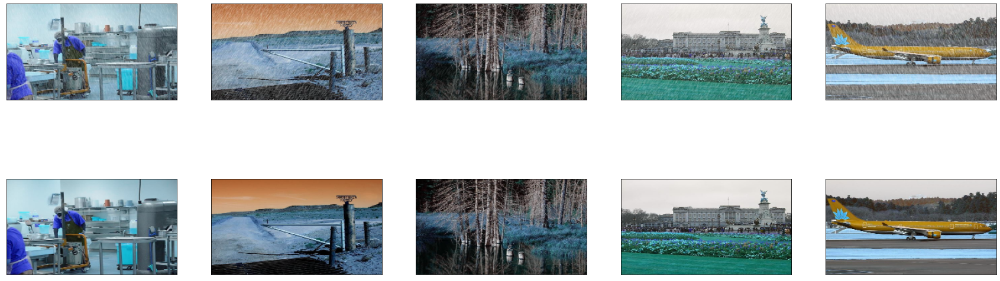

In [ ]:
display(x, y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42) # Splitting data to Train / Test

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42) # Splitting data to Train / Validation

In [ ]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(8640, 144, 256, 3)
(960, 144, 256, 3)
(2400, 144, 256, 3)
(8640, 144, 256, 3)
(960, 144, 256, 3)
(2400, 144, 256, 3)


Experiment 1:


Full CNN AutoEncoder Based on https://keras.io/examples/vision/autoencoder/


In [ ]:
model = Sequential()
model.add(layers.Conv2D(64, (3, 3), activation="LeakyReLU", padding="same", input_shape=(width_res, hight_res, 3)))
model.add(layers.MaxPooling2D((2, 2), padding="same"))
model.add(layers.Conv2D(128, (3, 3), activation="LeakyReLU", padding="same"))
model.add(layers.MaxPooling2D((2, 2), padding="same"))
model.add(layers.Conv2D(256, (3, 3), activation="LeakyReLU", padding="same"))
model.add(layers.MaxPooling2D((2, 2), padding="same"))
model.add(layers.Conv2DTranspose(256, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
model.add(layers.Conv2DTranspose(128, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
model.add(layers.Conv2DTranspose(64, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
model.add(layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same"))


In [ ]:
model.compile(optimizer="adam", loss="mean_absolute_error", metrics=["mean_squared_error"])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 144, 256, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 72, 128, 64)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 128, 128)      73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 64, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 36, 64, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 18, 32, 256)      0

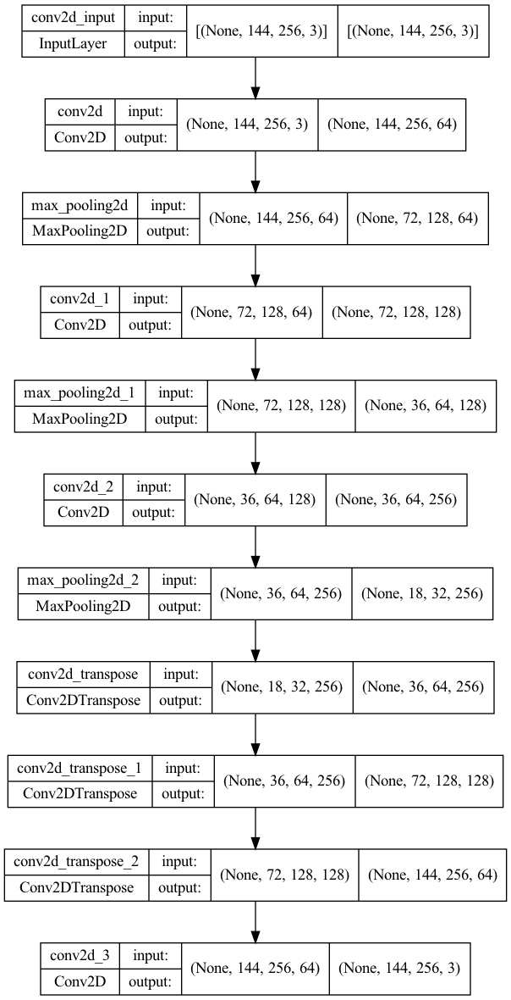

In [ ]:
plot_model(model, show_shapes=True)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=20,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
)

In [ ]:
hist = model.fit(
    x=X_train,
    y=y_train,
    epochs=10000,
    batch_size=32,
    shuffle=True,
    validation_data=(X_val, y_val),
    callbacks = [early_stopping],
)

Epoch 1/10000


2022-06-24 18:20:02.567525: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


270/270 [==============================] - 508s 2s/step - loss: 0.0956 - mean_squared_error: 0.0187 - val_loss: 0.0719 - val_mean_squared_error: 0.0107
Epoch 2/10000
270/270 [==============================] - 513s 2s/step - loss: 0.0661 - mean_squared_error: 0.0094 - val_loss: 0.0597 - val_mean_squared_error: 0.0079
Epoch 3/10000
270/270 [==============================] - 519s 2s/step - loss: 0.0595 - mean_squared_error: 0.0077 - val_loss: 0.0543 - val_mean_squared_error: 0.0069
Epoch 4/10000
270/270 [==============================] - 513s 2s/step - loss: 0.0546 - mean_squared_error: 0.0067 - val_loss: 0.0529 - val_mean_squared_error: 0.0064
Epoch 5/10000
270/270 [==============================] - 513s 2s/step - loss: 0.0524 - mean_squared_error: 0.0062 - val_loss: 0.0543 - val_mean_squared_error: 0.0065
Epoch 6/10000
270/270 [==============================] - 512s 2s/step - loss: 0.0506 - mean_squared_error: 0.0058 - val_loss: 0.0489 - val_mean_squared_error: 0.0056
Epoch 7/10000
270/

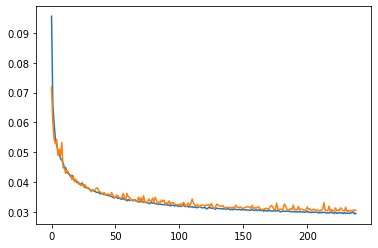

In [ ]:
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])

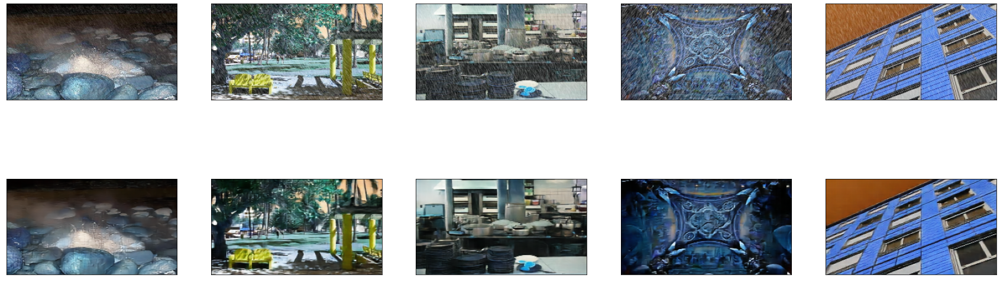

In [ ]:
predictions = model.predict(X_test)
display(X_test, predictions)

In [ ]:
model.save("/Desktop/cv-final-project-dataset/Full_Cnn.h5")

In [ ]:
reconstructed_model = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/Full_Cnn.h5")

In [ ]:
reconstructed_model.evaluate(X_test, y_test)

29/29 [==============================] - 18s 628ms/step - loss: 0.0290 - mean_squared_error: 0.0020


[0.02899746410548687, 0.002024831948801875]

In [ ]:
predictions = reconstructed_model.predict(X_test)

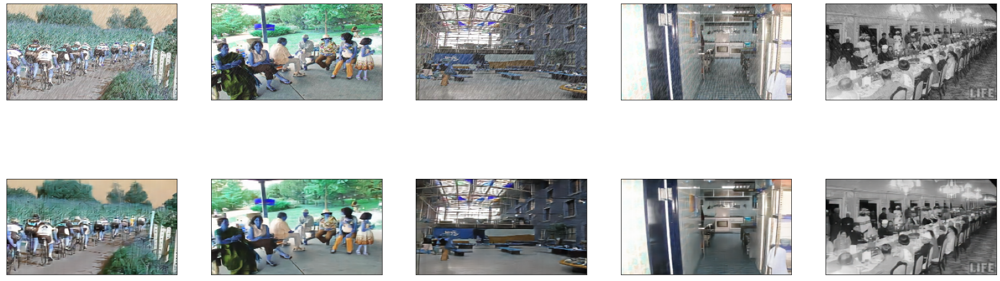

In [ ]:
display(X_test, predictions)

Experiment 2:

Stochastic AutoEncoder

In [ ]:
autoencoder = Sequential()
autoencoder.add(layers.Conv2D(64, (3, 3), activation="LeakyReLU", padding="same", input_shape=(width_res, hight_res, 3)))
autoencoder.add(layers.MaxPooling2D((2, 2), padding="same"))
autoencoder.add(layers.Conv2D(128, (3, 3), activation="LeakyReLU", padding="same"))
autoencoder.add(layers.MaxPooling2D((2, 2), padding="same"))
autoencoder.add(layers.Conv2D(256, (3, 3), activation="LeakyReLU", padding="same"))
autoencoder.add(layers.MaxPooling2D((2, 2), padding="same"))
autoencoder.add(layers.Flatten())
autoencoder.add(layers.Dense(64, activation="LeakyReLU"))
autoencoder.add(layers.Dropout(0.2))
autoencoder.add(layers.Dense(128, activation="LeakyReLU"))
autoencoder.add(layers.Dropout(0.2))
autoencoder.add(layers.Dense(256, activation="LeakyReLU"))
autoencoder.add(layers.Dropout(0.2))
autoencoder.add(layers.Dense(18 * 32 * 256, activation="LeakyReLU"))
autoencoder.add(layers.Reshape((18, 32, 256)))
autoencoder.add(layers.Conv2DTranspose(256, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
autoencoder.add(layers.Conv2DTranspose(128, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
autoencoder.add(layers.Conv2DTranspose(64, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
autoencoder.add(layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same"))

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0005)

In [ ]:
autoencoder.compile(optimizer=opt, loss="mean_absolute_error", metrics=["mean_squared_error"])

In [ ]:
autoencoder.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_19 (Conv2D)          (None, 144, 256, 64)      1792      
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 72, 128, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 72, 128, 128)      73856     
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 36, 64, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 36, 64, 256)       295168    
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 18, 32, 256)     

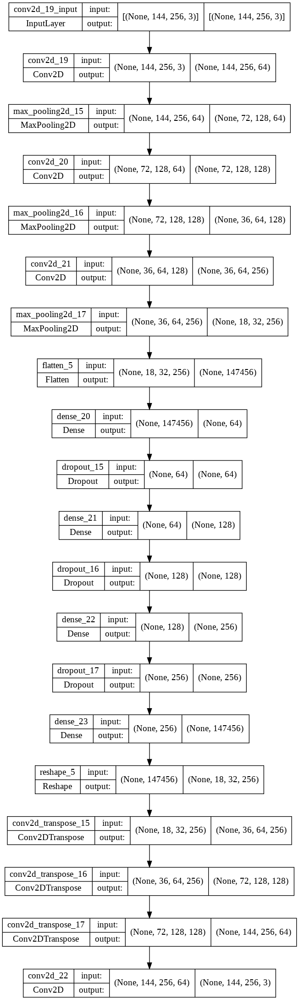

In [ ]:
plot_model(autoencoder, show_shapes=True)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=10,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
)

In [ ]:
class SaveModel(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
      self.model.save("/content/gdrive/MyDrive/cv-final-project-dataset/Stochastic_auto_encoder.h5")

In [ ]:
save_model = SaveModel()

In [ ]:
def Add_augmantion(X_train: np.array, y_train: np.array) -> Tuple[np.array, np.array]:
  X_train_aug, y_train_aug = [], []
  for x, y in zip(X_train, y_train):
    X_train_aug.append(x)
    X_train_aug.append(np.fliplr(x))
    y_train_aug.append(y)
    y_train_aug.append(np.fliplr(y))
  
  return np.array(X_train_aug), np.array(y_train_aug)




In [ ]:
X_train_aug, y_train_aug = Add_augmantion(X_train[:4500], y_train[:4500])

In [ ]:
print(X_train_aug.shape)
print(y_train_aug.shape)

(9000, 144, 256, 3)
(9000, 144, 256, 3)


In [ ]:
hist = autoencoder.fit(
    x=X_train_aug,
    y=y_train_aug,
    epochs=300,
    batch_size=1,
    shuffle=True,
    validation_data=(X_val, y_val),
    callbacks = [early_stopping, save_model]
)

Epoch 1/300
9000/9000 [==============================] - 131s 14ms/step - loss: 0.1662 - mean_squared_error: 0.0464 - val_loss: 0.1510 - val_mean_squared_error: 0.0395
Epoch 2/300
9000/9000 [==============================] - 124s 14ms/step - loss: 0.1512 - mean_squared_error: 0.0399 - val_loss: 0.1426 - val_mean_squared_error: 0.0354
Epoch 3/300
9000/9000 [==============================] - 124s 14ms/step - loss: 0.1469 - mean_squared_error: 0.0383 - val_loss: 0.1339 - val_mean_squared_error: 0.0324
Epoch 4/300
9000/9000 [==============================] - 124s 14ms/step - loss: 0.1435 - mean_squared_error: 0.0371 - val_loss: 0.1328 - val_mean_squared_error: 0.0328
Epoch 5/300
9000/9000 [==============================] - 123s 14ms/step - loss: 0.1419 - mean_squared_error: 0.0364 - val_loss: 0.1299 - val_mean_squared_error: 0.0322
Epoch 6/300
9000/9000 [==============================] - 123s 14ms/step - loss: 0.1405 - mean_squared_error: 0.0359 - val_loss: 0.1318 - val_mean_squared_error:

In [ ]:
autoencoder.evaluate(X_test, y_test)

75/75 [==============================] - 6s 62ms/step - loss: 0.1233 - mean_squared_error: 0.0291


[0.12328716367483139, 0.0291000809520483]

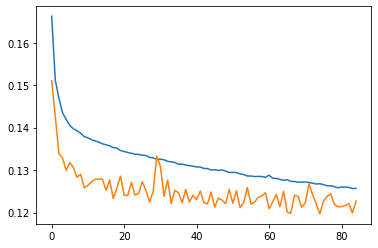

In [ ]:
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])

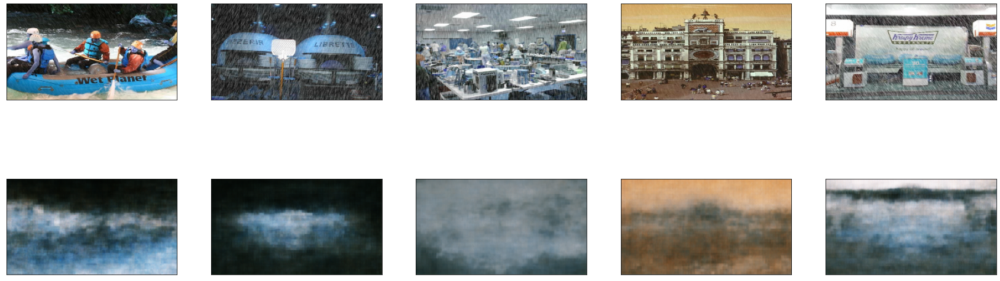

In [ ]:
predictions = autoencoder.predict(X_test)
display(X_test, predictions)

Experiment 3:

CGAN BASED ON : https://keras.io/examples/generative/conditional_gan/ + L1 loss

In [ ]:
discriminator = Sequential(name="discriminator")
discriminator.add(layers.Conv2D(64, (3, 3), strides=(2, 2), activation="LeakyReLU", padding="same", input_shape=(width_res, hight_res, 3)))
discriminator.add(layers.MaxPooling2D((2, 2), padding="same"))
discriminator.add(layers.Conv2D(128, (3, 3), strides=(2, 2), activation="LeakyReLU", padding="same"))
discriminator.add(layers.MaxPooling2D((2, 2), padding="same"))
discriminator.add(layers.Flatten())
discriminator.add(layers.Dense(128, activation="LeakyReLU"))
discriminator.add(layers.Dropout(0.2))
discriminator.add(layers.Dense(64, activation="LeakyReLU"))
discriminator.add(layers.Dropout(0.2))
discriminator.add(layers.Dense(1, activation="sigmoid"))

In [ ]:
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 72, 128, 64)       1792      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 36, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 18, 32, 128)       73856     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 9, 16, 128)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 18432)             0         
                                                                 
 dense_4 (Dense)             (None, 128)             

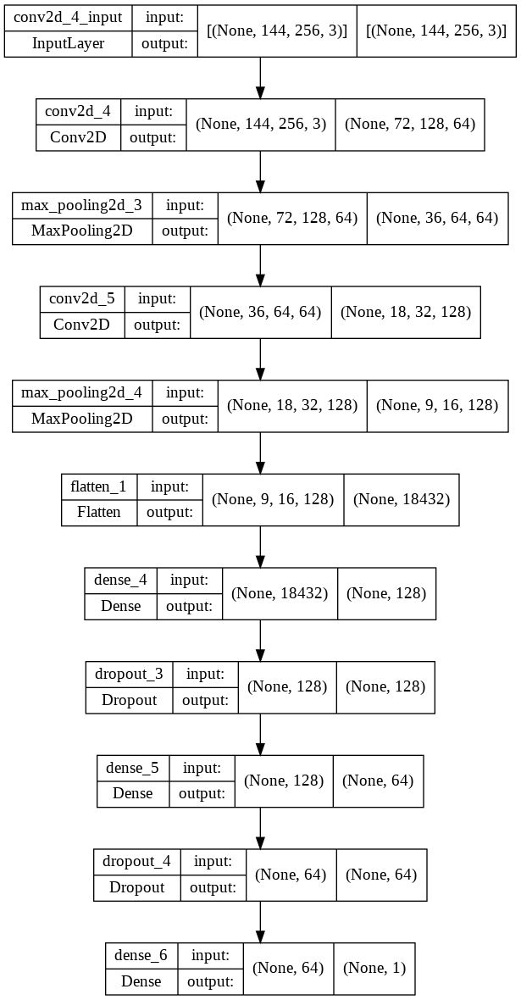

In [ ]:
plot_model(discriminator, show_shapes=True)

In [ ]:
generator = Sequential(name="generator")
generator.add(layers.Conv2D(64, (3, 3), activation="LeakyReLU", padding="same", input_shape=(width_res, hight_res, 3)))
generator.add(layers.MaxPooling2D((2, 2), padding="same"))
generator.add(layers.Conv2D(128, (3, 3), activation="LeakyReLU", padding="same"))
generator.add(layers.MaxPooling2D((2, 2), padding="same"))
generator.add(layers.Conv2D(256, (3, 3), activation="LeakyReLU", padding="same"))
generator.add(layers.MaxPooling2D((2, 2), padding="same"))
generator.add(layers.Conv2DTranspose(256, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
generator.add(layers.Conv2DTranspose(128, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
generator.add(layers.Conv2DTranspose(64, (3, 3), strides=2, activation="LeakyReLU", padding="same"))
generator.add(layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same"))

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 144, 256, 64)      1792      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 72, 128, 64)      0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 72, 128, 128)      73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 36, 64, 128)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 36, 64, 256)       295168    
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 18, 32, 256)      0 

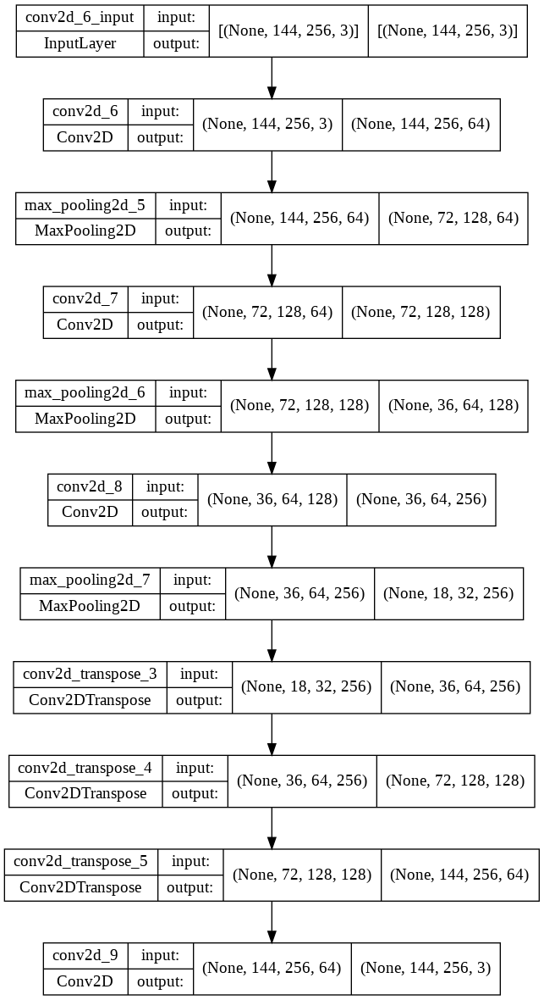

In [ ]:
plot_model(generator, show_shapes=True)

In [ ]:
class ConditionalGAN(Model):
  def __init__(self, discriminator, generator):
      super(ConditionalGAN, self).__init__()
      self.discriminator = discriminator
      self.generator = generator
      self.gen_loss_tracker = tf.keras.metrics.Mean(name="generator_loss")
      self.disc_loss_tracker = tf.keras.metrics.Mean(name="discriminator_loss")
      self.batch_size = 4

  @property
  def metrics(self):
      return [self.gen_loss_tracker, self.disc_loss_tracker]

  def compile(self, d_optimizer, g_optimizer, bin_loss_fn, mean_loss_fn):
      super(ConditionalGAN, self).compile()
      self.d_optimizer = d_optimizer
      self.g_optimizer = g_optimizer
      self.bin_loss_fn = bin_loss_fn
      self.mean_loss_fn = mean_loss_fn
      

  def train_step(self, data):
    rain, not_rain = data
    labels = tf.concat([tf.ones((self.batch_size, 1)), tf.zeros((self.batch_size, 1))], axis=0)
    fake_not_rain = self.generator(rain)
    combined_images = tf.concat([not_rain, fake_not_rain], axis=0)

    # Train the discriminator.
    with tf.GradientTape() as tape:
      predictions = self.discriminator(combined_images)
      d_loss = self.bin_loss_fn(labels, predictions)
    grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
    self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))

    # Assemble labels that say "all real images".
    misleading_labels = tf.ones((self.batch_size, 1))

    # Train the generator (note that we should *not* update the weights
    # of the discriminator)!
    with tf.GradientTape() as tape:
        fake_not_rain = self.generator(rain)
        predictions = self.discriminator(fake_not_rain)
        g_loss = 0.3 * self.bin_loss_fn(misleading_labels, predictions) + 0.7 * self.mean_loss_fn(not_rain, fake_not_rain) 
    grads = tape.gradient(g_loss, self.generator.trainable_weights)
    self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))


    # Monitor loss.
    self.gen_loss_tracker.update_state(g_loss)
    self.disc_loss_tracker.update_state(d_loss)
    return {
        "g_loss": self.gen_loss_tracker.result(),
        "d_loss": self.disc_loss_tracker.result(),
    }

Resume training

In [ ]:
generator = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/CGAN.h5")

In [ ]:
cond_gan = ConditionalGAN(discriminator=discriminator, generator=generator)
cond_gan.compile(
    d_optimizer= tf.keras.optimizers.Adam(),
    g_optimizer= tf.keras.optimizers.Adam(learning_rate=0.0001),
    bin_loss_fn= tf.keras.losses.BinaryCrossentropy(),
    mean_loss_fn = tf.keras.losses.MeanAbsoluteError()

)

In [ ]:
class PerformancePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def on_epoch_end(self, epoch, logs={}):
      fake = self.model.generator.predict(self.x)
      if epoch % 50 == 0:
        display(self.y, fake)

In [ ]:
class SaveModel(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
      self.model.generator.save("/content/gdrive/MyDrive/cv-final-project-dataset/CGAN.h5")

In [ ]:
performance = PerformancePlotCallback(X_val, y_val)
save_model = SaveModel()

Epoch 1/100
409/410 [============================>.] - ETA: 0s - g_loss: 0.2959 - d_loss: 0.7237

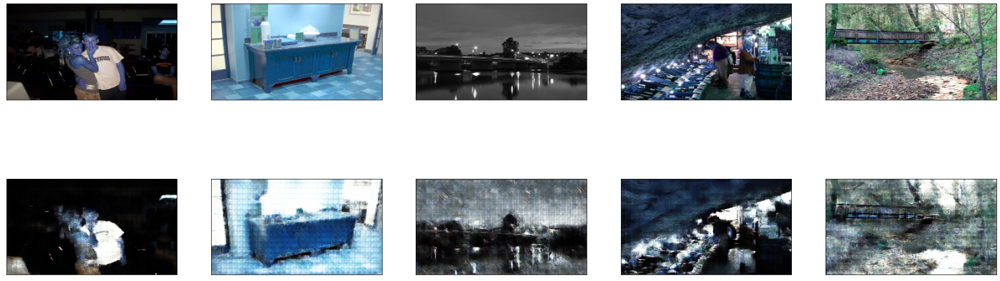

410/410 [==============================] - 28s 40ms/step - g_loss: 0.2959 - d_loss: 0.7236
Epoch 2/100
410/410 [==============================] - 16s 38ms/step - g_loss: 0.3516 - d_loss: 0.7050
Epoch 3/100
410/410 [==============================] - 16s 38ms/step - g_loss: 0.3505 - d_loss: 0.6996
Epoch 4/100
410/410 [==============================] - 15s 38ms/step - g_loss: 0.3330 - d_loss: 0.6855
Epoch 5/100
410/410 [==============================] - 15s 37ms/step - g_loss: 0.3271 - d_loss: 0.6964
Epoch 6/100
410/410 [==============================] - 15s 37ms/step - g_loss: 0.3082 - d_loss: 0.6774
Epoch 7/100
410/410 [==============================] - 15s 38ms/step - g_loss: 0.3172 - d_loss: 0.7151
Epoch 8/100
410/410 [==============================] - 16s 38ms/step - g_loss: 0.3233 - d_loss: 0.6901
Epoch 9/100
410/410 [==============================] - 16s 38ms/step - g_loss: 0.2920 - d_loss: 0.6669
Epoch 10/100
410/410 [==============================] - 15s 37ms/step - g_loss: 0.297

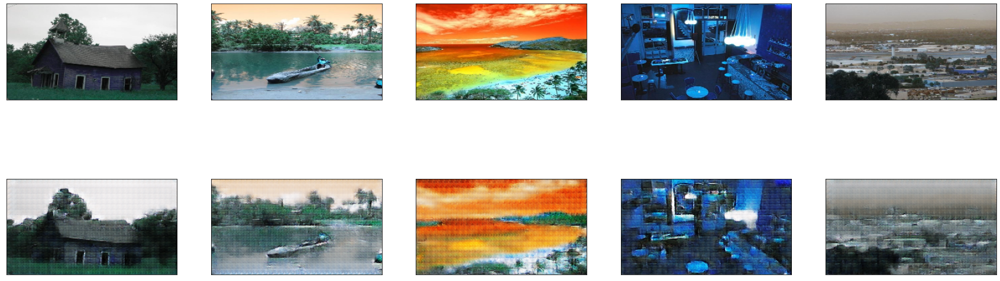

410/410 [==============================] - 16s 39ms/step - g_loss: 0.3124 - d_loss: 0.6656
Epoch 52/100
410/410 [==============================] - 15s 38ms/step - g_loss: 0.3256 - d_loss: 0.6920
Epoch 53/100
410/410 [==============================] - 15s 37ms/step - g_loss: 0.3235 - d_loss: 0.6653
Epoch 54/100
410/410 [==============================] - 15s 38ms/step - g_loss: 0.2993 - d_loss: 0.6985
Epoch 55/100
410/410 [==============================] - 15s 37ms/step - g_loss: 0.3186 - d_loss: 0.7192
Epoch 56/100
410/410 [==============================] - 16s 38ms/step - g_loss: 0.3279 - d_loss: 0.7123
Epoch 57/100
410/410 [==============================] - 15s 38ms/step - g_loss: 0.3561 - d_loss: 0.7348
Epoch 58/100
410/410 [==============================] - 15s 37ms/step - g_loss: 0.2814 - d_loss: 0.6752
Epoch 59/100
410/410 [==============================] - 16s 38ms/step - g_loss: 0.3910 - d_loss: 0.7701
Epoch 60/100
410/410 [==============================] - 15s 37ms/step - g_los

In [ ]:
hist = cond_gan.fit(x=X_train, y=y_train, epochs=100, batch_size=4, callbacks = [performance, save_model])

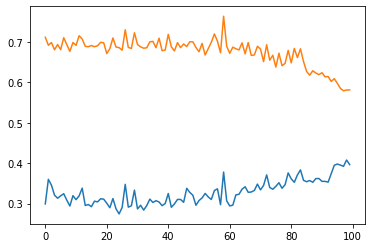

In [ ]:
plt.plot(hist.history['g_loss'])
plt.plot(hist.history['d_loss'])

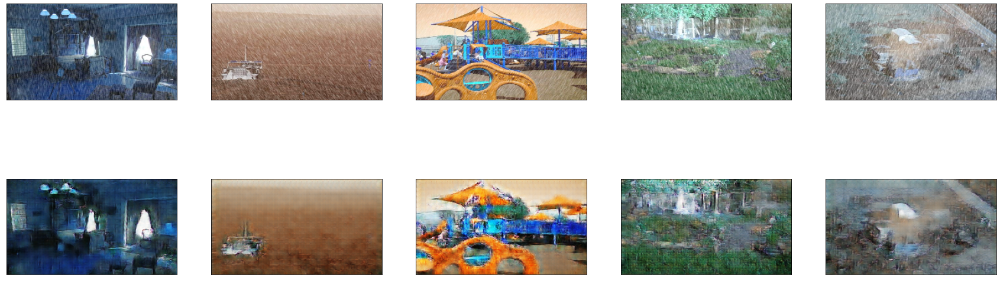

In [ ]:
predictions = generator.predict(X_test)
display(X_test, predictions)

CGAN base on : https://arxiv.org/pdf/1611.07004.pdf pix2pix unet architecture

In [ ]:
#256p Res
width_res = 256
hight_res = 256

In [ ]:
x, y = LoadData(training_data_folder, True)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [ ]:
def data_normalize(array: np.array) -> np.array:
    """
    Normalizes the supplied array to values between [-1,1] and reshapes it into the appropriate format.
    """
    array = (array.astype("float32") / 127.5) - 1
    return array


In [ ]:
X_train = data_normalize(X_train)
X_val = data_normalize(X_val)
X_test = data_normalize(X_test)
y_train = data_normalize(y_train)
y_val = data_normalize(y_val)
y_test = data_normalize(y_test)

In [ ]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(8640, 256, 256, 3)
(960, 256, 256, 3)
(2400, 256, 256, 3)
(8640, 256, 256, 3)
(960, 256, 256, 3)
(2400, 256, 256, 3)


In [ ]:
def down_block(layer_in, number_of_filters: int, batch_norm: bool =True):
  
    init_weights = tf.keras.initializers.RandomNormal(stddev=0.02)
    
    block = layers.Conv2D(number_of_filters, 4, strides=(2,2), padding='same', kernel_initializer=init_weights)(layer_in)

    if batch_norm:
        block = layers.BatchNormalization()(block, training=True)

    block = layers.LeakyReLU(0.2)(block)
    return block

In [ ]:
def up_block(layer_in, skip_in, number_of_filters: int, apply_dropout: bool=True):

    init_weights = tf.keras.initializers.RandomNormal(stddev=0.02)

    block = layers.Conv2DTranspose(number_of_filters, 4, strides=(2,2), padding='same', activation="relu", kernel_initializer=init_weights)(layer_in)

    block = layers.BatchNormalization()(block, training=True)

    if apply_dropout:
        block = layers.Dropout(0.5)(block, training=True)

    block = layers.Concatenate()([block, skip_in])

    return block

Discriminator

In [ ]:
def create_discriminator():
  input = layers.Input(shape=(width_res, hight_res, 3), name='input_image')
  target = layers.Input(shape=(width_res, hight_res, 3), name='target_image')

  input_layer = layers.concatenate([input, target])  # (batch_size, 256, 256, 3*2)
  d1 = down_block(input_layer, 64, batch_norm=False)  # (batch_size, 128, 128, 64)
  d2 = down_block(d1,128)  # (batch_size, 64, 64, 128)
  d3 = down_block(d2,256)  # (batch_size, 32, 32, 256)
  d4 = down_block(d3, 512) # (batch_size, 16, 16, 512)
  d5 = down_block(d4, 512) # (batch_size, 8, 8, 512)
  d6 = down_block(d5, 512) # (batch_size, 4, 4, 512)

  flatten = layers.Flatten()(d6)
  dense1 = layers.Dense(256,activation='relu')(flatten)
  last_layer = layers.Dense(1,activation='sigmoid')(dense1)

  return tf.keras.Model(inputs=[input, target], outputs=last_layer)

In [ ]:
discriminator = create_discriminator()

In [ ]:
discriminator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 target_image (InputLayer)      [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate (Concatenate)      (None, 256, 256, 6)  0           ['input_image[0][0]',            
                                                                  'target_image[0][0]']       

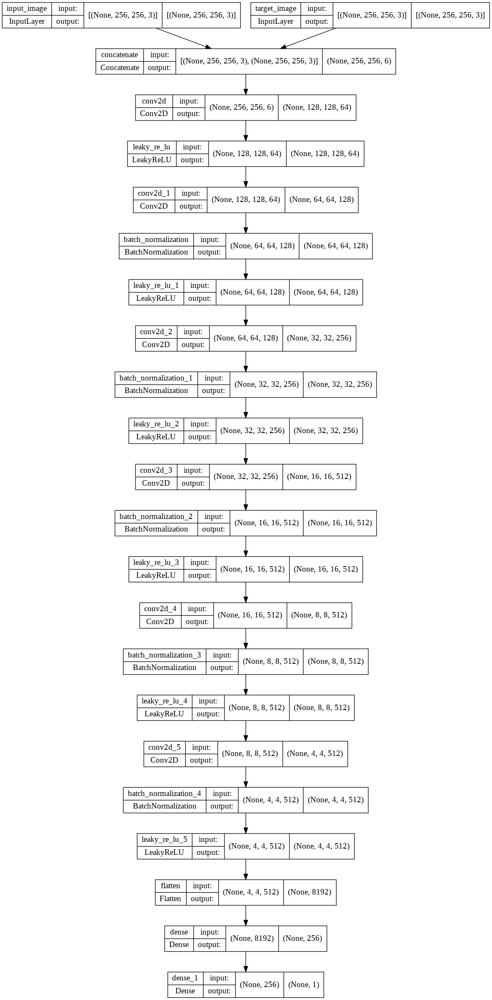

In [ ]:
plot_model(discriminator, show_shapes=True)

Generator

In [ ]:
def create_generator(image_shape=(width_res,hight_res,3)):

    init_weights = tf.keras.initializers.RandomNormal(stddev=0.02)
    
    in_image = layers.Input(shape=image_shape)

    #encoder
    e1 = down_block(in_image, 64, batch_norm=False) # 128,128
    e2 = down_block(e1, 64) # 64,64
    e3 = down_block(e2, 128) # 32, 32
    e4 = down_block(e3, 256) # 16, 16
    e5 = down_block(e4, 512) # 8,8
    e6 = down_block(e5, 512) # 4,4 
    e7 = down_block(e6, 512) # 2,2

    #decoder
    d1 = up_block(e7, e6, 512)
    d2 = up_block(d1, e5, 512)
    d3 = up_block(d2, e4, 512, apply_dropout=False)
    d4 = up_block(d3, e3, 256, apply_dropout=False)
    d5 = up_block(d4, e2, 128, apply_dropout=False)
    d6 = up_block(d5, e1, 64, apply_dropout=False)

    last_layer = layers.Conv2DTranspose(3, 4, strides=(2,2),activation ="tanh", padding='same', kernel_initializer=init_weights)(d6)

    generator = Model(in_image, last_layer)
    return generator

In [ ]:
generator = create_generator((width_res,hight_res,3))

In [ ]:
generator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 128, 128, 64  3136        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 leaky_re_lu_6 (LeakyReLU)      (None, 128, 128, 64  0           ['conv2d_6[0][0]']               
                                )                                                           

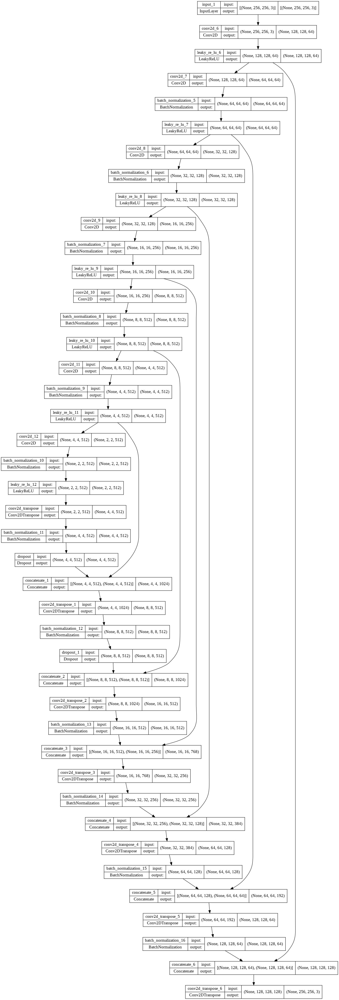

In [ ]:
plot_model(generator, show_shapes=True)

In [ ]:
class ConditionalGAN(Model):
  def __init__(self, discriminator, generator):
      super(ConditionalGAN, self).__init__()
      self.discriminator = discriminator
      self.generator = generator
      self.gen_loss_tracker = tf.keras.metrics.Mean(name="generator_loss")
      self.disc_loss_tracker = tf.keras.metrics.Mean(name="discriminator_loss")
      self.batch_size = 10

  @property
  def metrics(self):
      return [self.gen_loss_tracker, self.disc_loss_tracker]

  def compile(self, d_optimizer, g_optimizer, bin_loss_fn, mean_loss_fn):
      super(ConditionalGAN, self).compile()
      self.d_optimizer = d_optimizer
      self.g_optimizer = g_optimizer
      self.bin_loss_fn = bin_loss_fn
      self.mean_loss_fn = mean_loss_fn
  
  def discriminator_loss(self, real_images_discriminator_output, fake_images_discriminator_output):
    real_loss = self.bin_loss_fn(tf.ones_like(real_images_discriminator_output), real_images_discriminator_output)
    generated_loss = self.bin_loss_fn(tf.zeros_like(fake_images_discriminator_output), fake_images_discriminator_output)
    return real_loss + generated_loss
      

  def train_step(self, data):
    rain, not_rain = data

    # Train the discriminator.
    with tf.GradientTape() as tape:
      fake_not_rain_images = self.generator(rain, training=True)
      discriminator_on_real_images = discriminator([rain, not_rain], training=True)
      discriminator_on_fake_images = discriminator([rain, fake_not_rain_images], training=True)
      d_loss = self.discriminator_loss(discriminator_on_real_images, discriminator_on_fake_images)
    grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
    self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))


    # Train the generator (note that we should *not* update the weights
    # of the discriminator)!
    with tf.GradientTape() as tape:
      fake_not_rain_images = self.generator(rain, training=True)
      discriminator_on_fake_images = discriminator([rain, fake_not_rain_images], training=True)
      g_loss_discriminator = self.bin_loss_fn(tf.ones_like(discriminator_on_fake_images), discriminator_on_fake_images)
      g_loss = g_loss_discriminator + 100 * self.mean_loss_fn(not_rain, fake_not_rain_images) 
    grads = tape.gradient(g_loss, self.generator.trainable_weights)
    self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))


    # Monitor loss.
    self.gen_loss_tracker.update_state(g_loss)
    self.disc_loss_tracker.update_state(d_loss)
    return {
        "g_loss": self.gen_loss_tracker.result(),
        "d_loss": self.disc_loss_tracker.result(),
    }

In [ ]:
cond_gan = ConditionalGAN(discriminator=discriminator, generator=generator)
cond_gan.compile(
    d_optimizer= tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999),
    g_optimizer= tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999),
    bin_loss_fn= tf.keras.losses.BinaryCrossentropy(),
    mean_loss_fn = tf.keras.losses.MeanAbsoluteError()

)

In [ ]:
import random
class PerformancePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self, x, y):
        self.x = x[:10]
        self.y = y[:10]

    def on_epoch_end(self, epoch, logs={}):
      if epoch % 30 == 0:
        prediction = self.model.generator.predict(self.x)
        plt.figure(figsize=(15, 15))
        index = random.randint(0, 9)

        display_list = [self.x[index], self.y[index], prediction[index]]
        title = ['Input Image', 'Ground Truth', 'Generated Image']
        
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
        plt.show()


In [ ]:
class SaveModel(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
      self.model.generator.save("/content/gdrive/MyDrive/cv-final-project-dataset/CGAN_UNeT.h5")

In [ ]:
performance = PerformancePlotCallback(X_val, y_val)
save_model = SaveModel()

Epoch 1/200
864/864 [==============================] - ETA: 0s - g_loss: 17.9726 - d_loss: 1.2724

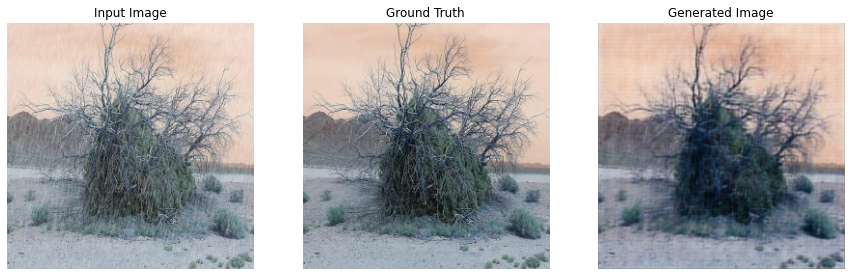

864/864 [==============================] - 159s 168ms/step - g_loss: 17.9672 - d_loss: 1.2724
Epoch 2/200
864/864 [==============================] - 145s 167ms/step - g_loss: 9.6577 - d_loss: 1.2358
Epoch 3/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.6334 - d_loss: 1.2478
Epoch 4/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.1658 - d_loss: 1.2028
Epoch 5/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.0468 - d_loss: 1.1047
Epoch 6/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.9671 - d_loss: 0.7769
Epoch 7/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.1080 - d_loss: 0.7077
Epoch 8/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.2679 - d_loss: 0.7171
Epoch 9/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.4244 - d_loss: 0.8826
Epoch 10/200
864/864 [==============================] - 144s 167ms

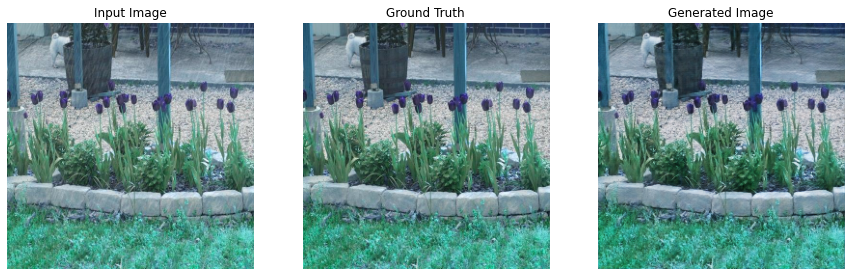

864/864 [==============================] - 144s 167ms/step - g_loss: 7.0874 - d_loss: 1.0931
Epoch 32/200
864/864 [==============================] - 144s 166ms/step - g_loss: 8.7515 - d_loss: 0.7122
Epoch 33/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.4995 - d_loss: 0.6889
Epoch 34/200
864/864 [==============================] - 144s 166ms/step - g_loss: 9.5830 - d_loss: 0.4472
Epoch 35/200
864/864 [==============================] - 144s 166ms/step - g_loss: 8.9278 - d_loss: 0.5523
Epoch 36/200
864/864 [==============================] - 144s 166ms/step - g_loss: 9.2809 - d_loss: 0.5537
Epoch 37/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.9959 - d_loss: 0.3896
Epoch 38/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.3314 - d_loss: 0.5739
Epoch 39/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.5827 - d_loss: 0.6219
Epoch 40/200
864/864 [==============================] - 144

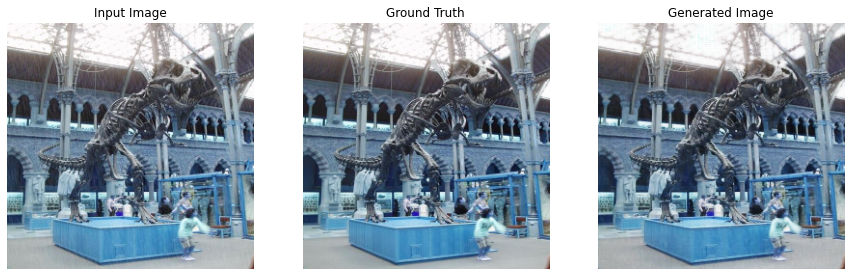

864/864 [==============================] - 145s 167ms/step - g_loss: 10.1292 - d_loss: 0.3411
Epoch 62/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.0014 - d_loss: 0.3234
Epoch 63/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.5004 - d_loss: 0.5131
Epoch 64/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.4597 - d_loss: 0.2469
Epoch 65/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.3879 - d_loss: 0.3764
Epoch 66/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.5247 - d_loss: 0.4819
Epoch 67/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.2091 - d_loss: 0.4415
Epoch 68/200
864/864 [==============================] - 144s 167ms/step - g_loss: 8.9010 - d_loss: 0.4966
Epoch 69/200
864/864 [==============================] - 144s 167ms/step - g_loss: 12.3934 - d_loss: 0.2225
Epoch 70/200
864/864 [==============================] -

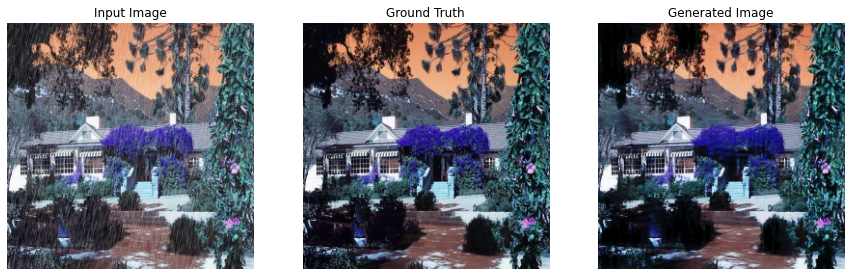

864/864 [==============================] - 144s 167ms/step - g_loss: 10.6803 - d_loss: 0.2792
Epoch 92/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.3171 - d_loss: 0.4506
Epoch 93/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.7330 - d_loss: 0.2234
Epoch 94/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.8078 - d_loss: 0.4179
Epoch 95/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.2321 - d_loss: 0.4270
Epoch 96/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.8107 - d_loss: 0.3955
Epoch 97/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.5504 - d_loss: 0.2919
Epoch 98/200
864/864 [==============================] - 145s 168ms/step - g_loss: 10.1769 - d_loss: 0.3248
Epoch 99/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.1300 - d_loss: 0.3843
Epoch 100/200
864/864 [==============================

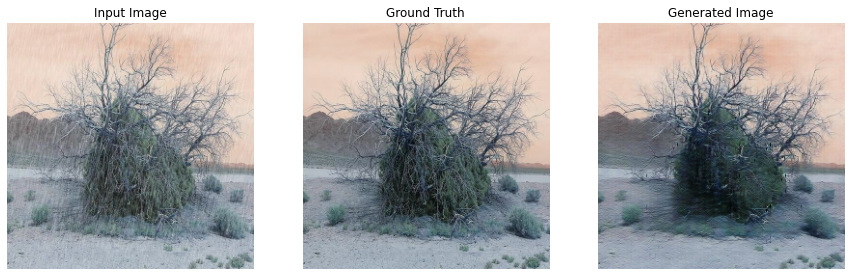

864/864 [==============================] - 144s 167ms/step - g_loss: 10.3545 - d_loss: 0.2625
Epoch 122/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.5093 - d_loss: 0.3454
Epoch 123/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.9501 - d_loss: 0.1921
Epoch 124/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.7755 - d_loss: 0.3864
Epoch 125/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.9982 - d_loss: 0.3365
Epoch 126/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.1736 - d_loss: 0.3125
Epoch 127/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.9775 - d_loss: 0.3104
Epoch 128/200
864/864 [==============================] - 144s 167ms/step - g_loss: 9.8265 - d_loss: 0.3373
Epoch 129/200
864/864 [==============================] - 145s 168ms/step - g_loss: 9.9756 - d_loss: 0.2278
Epoch 130/200
864/864 [=========================

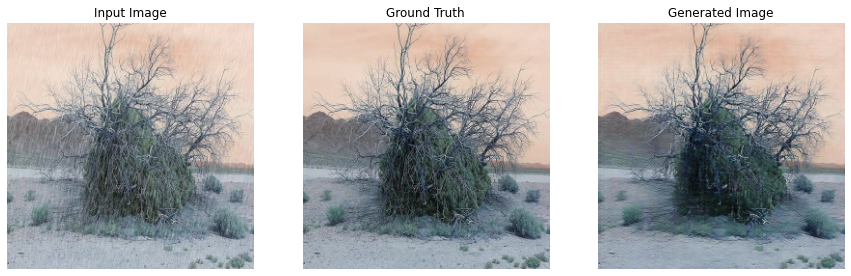

864/864 [==============================] - 144s 167ms/step - g_loss: 10.8997 - d_loss: 0.2888
Epoch 152/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.8312 - d_loss: 0.2658
Epoch 153/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.7607 - d_loss: 0.2078
Epoch 154/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.8818 - d_loss: 0.2598
Epoch 155/200
864/864 [==============================] - 144s 167ms/step - g_loss: 11.2653 - d_loss: 0.1960
Epoch 156/200
864/864 [==============================] - 144s 167ms/step - g_loss: 11.2486 - d_loss: 0.2192
Epoch 157/200
864/864 [==============================] - 144s 166ms/step - g_loss: 11.4009 - d_loss: 0.2007
Epoch 158/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.5446 - d_loss: 0.2985
Epoch 159/200
864/864 [==============================] - 144s 167ms/step - g_loss: 11.5612 - d_loss: 0.2201
Epoch 160/200
864/864 [===================

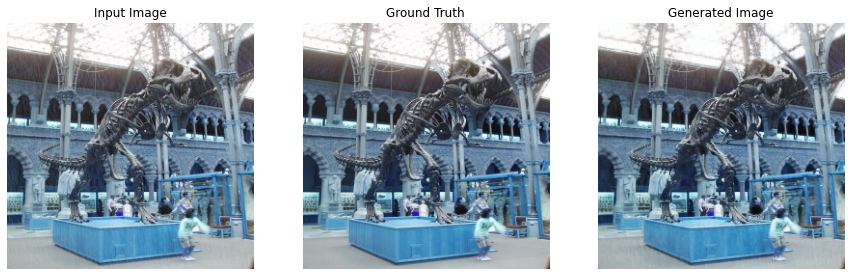

864/864 [==============================] - 144s 167ms/step - g_loss: 10.7091 - d_loss: 0.2407
Epoch 182/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.2160 - d_loss: 0.3957
Epoch 183/200
864/864 [==============================] - 144s 167ms/step - g_loss: 11.0423 - d_loss: 0.2384
Epoch 184/200
864/864 [==============================] - 144s 167ms/step - g_loss: 11.1096 - d_loss: 0.1978
Epoch 185/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.9940 - d_loss: 0.2278
Epoch 186/200
864/864 [==============================] - 144s 167ms/step - g_loss: 10.1716 - d_loss: 0.3364
Epoch 187/200
864/864 [==============================] - 144s 167ms/step - g_loss: 11.0930 - d_loss: 0.2978
Epoch 188/200
864/864 [==============================] - 144s 167ms/step - g_loss: 11.0970 - d_loss: 0.1851
Epoch 189/200
864/864 [==============================] - 144s 167ms/step - g_loss: 14.0772 - d_loss: 0.0655
Epoch 190/200
864/864 [===================

In [ ]:
hist = cond_gan.fit(x=X_train, y=y_train, epochs=200, batch_size=10, callbacks = [performance, save_model])

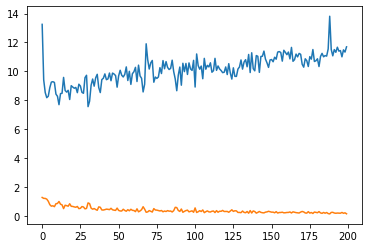

In [ ]:
plt.plot(hist.history['g_loss'])
plt.plot(hist.history['d_loss'])

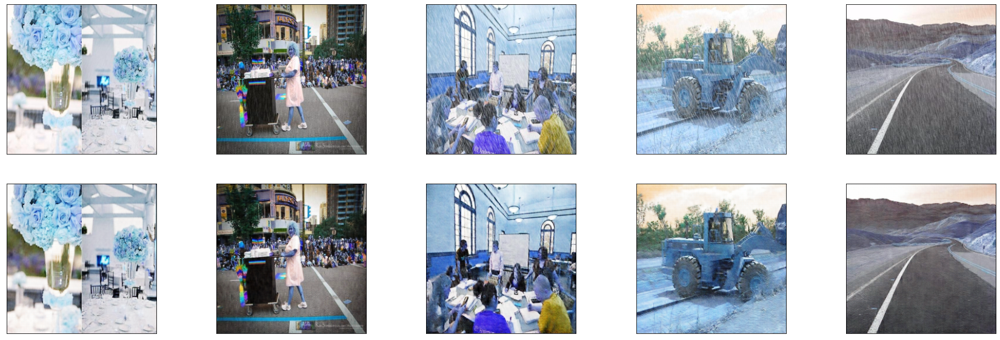

In [ ]:
predictions = generator.predict(X_test[:30])
display(X_test[:30] * 0.5 + 0.5, predictions * 0.5 + 0.5)

In [ ]:
generator = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/CGAN_UNeT.h5")

In [ ]:
fake = generator.predict(X_test[:2])

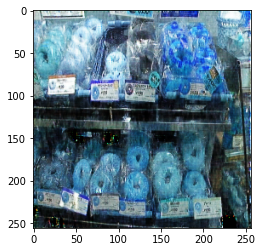

In [ ]:
plt.imshow(fake[0] * 0.5 +0.5)

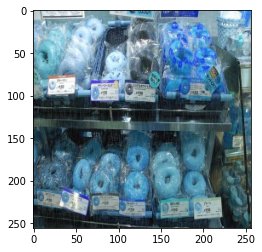

In [ ]:
plt.imshow(X_test[0] * 0.5 +0.5)

Compare Models

In [ ]:
test_data_folder = "/content/DID-MDN-test"

Prepare data for Full Cnn autoencoder, Stochastic autoencoder and Cgan based on keras example

In [ ]:
rain_144_256, not_rain_144_256 = LoadData(test_data_folder, True)

In [ ]:
rain_144_256 = preprocess(rain_144_256)
not_rain_144_256 = preprocess(not_rain_144_256)

In [ ]:
print(rain_144_256.shape)
print(not_rain_144_256.shape)

(1201, 144, 256, 3)
(1201, 144, 256, 3)


Prepare data for Cgan based on pix2pix paper example

In [ ]:
width_res = 256
hight_res = 256

In [ ]:
rain_256_256, not_rain_256_256 = LoadData(test_data_folder, True)

In [ ]:
rain_256_256 = data_normalize(rain_256_256)
not_rain_256_256 = data_normalize(not_rain_256_256)

In [ ]:
print(rain_256_256.shape)
print(not_rain_256_256.shape)

(1201, 256, 256, 3)
(1201, 256, 256, 3)


Load Models

In [ ]:
full_cnn_autoencoder = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/Full_Cnn.h5")

In [ ]:
stochastic_auto_encoder = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/Stochastic_auto_encoder.h5")

In [ ]:
cgan_generator = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/CGAN.h5")

In [ ]:
cgan_unet_generator = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/CGAN_UNeT.h5")

Make predictions

In [ ]:
full_cnn_autoencoder_predictions = full_cnn_autoencoder.predict(rain_144_256)

In [ ]:
stochastic_auto_encoder_predictions = stochastic_auto_encoder.predict(rain_144_256)

In [ ]:
cgan_generator_predictions = cgan_generator.predict(rain_144_256)

In [ ]:
cgan_unet_generator_predictions = cgan_unet_generator.predict(rain_256_256)

Compare results on test

In [ ]:
import random

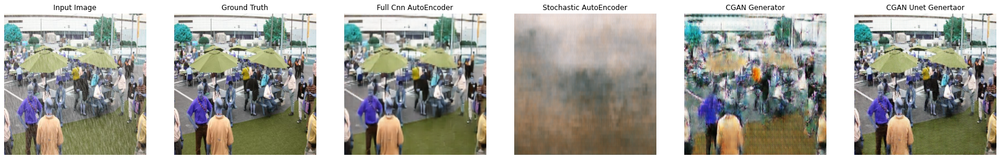

In [ ]:
plt.figure(figsize=(30, 15))
index = random.randint(0, len(rain_256_256) - 1)

display_list = [rain_256_256[index], not_rain_256_256[index], 
                full_cnn_autoencoder_predictions[index], 
                stochastic_auto_encoder_predictions[index],
                cgan_generator_predictions[index],
                cgan_unet_generator_predictions[index]]
title = ['Input Image', 'Ground Truth', 'Full Cnn AutoEncoder',
         "Stochastic AutoEncoder", "CGAN Generator",
         "CGAN Unet Genertaor"]

for i in range(len(title)):
    plt.subplot(1, 6, i+1)
    plt.title(title[i])
    if title[i] in ['Input Image', 'Ground Truth', "CGAN Unet Genertaor"]:
      plt.imshow(display_list[i] * 0.5 + 0.5)
    else:
      plt.imshow(cv2.resize(display_list[i], (256,256)))
    plt.axis('off')
plt.show()

Save Full cnn wights (Best Model)

In [ ]:
full_cnn_autoencoder.save_weights("/content/gdrive/MyDrive/cv-final-project-dataset/Full_Cnn_weights.h5")

Load Best Model for single shot prediction

In [ ]:
from google.colab import files

In [ ]:
uploaded = files.upload()

Saving test_photo.jpg to test_photo.jpg


In [ ]:
uploaded.keys()

dict_keys(['test_photo.jpg'])

In [ ]:
def predict_image(uploaded):
  main_path = "/content/gdrive/MyDrive/cv-final-project-dataset"
  for p_name in uploaded.keys():
    path_to_photo = main_path + "/" + p_name
  image = cv2.imread(path_to_photo)
  image = cv2.resize(image, (256,144))
  image = image / 255
  model = tf.keras.models.load_model("/content/gdrive/MyDrive/cv-final-project-dataset/Full_Cnn.h5")
  predicted = model.predict(np.expand_dims(image, axis = 0))[0]
  display_list = [image, predicted]
  title = ['Input Image', 'Predicted Image']
  plt.figure(figsize=(15, 15))
  for i in range(2):
      plt.subplot(1, 2, i+1)
      plt.title(title[i])
      plt.imshow(display_list[i])
      plt.axis('off')
  plt.show()




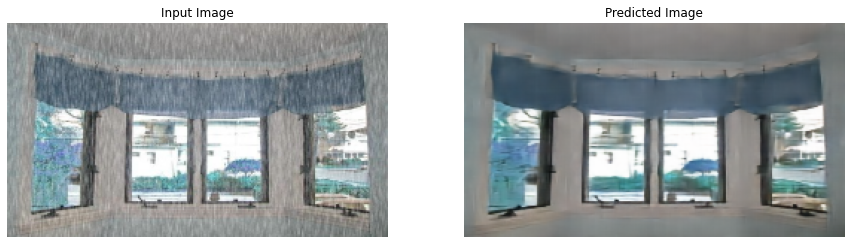

In [ ]:
predict_image(uploaded)